<a href="https://colab.research.google.com/github/gabrbrr/ComputerVision/blob/main/CVproject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install opencv-python-headless
!pip install scikit-learn wandb pillow  wget tqdm


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.4/311.4 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.9 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=961cc93a8e1d433e63b9ba32390ac4036c654485b99565c95d60e2b46da08d0b
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [3]:
from google.colab import drive
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
import wget
import time
import pickle
import yaml
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import cv2
import wandb
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, roc_curve, precision_score, recall_score, precision_recall_curve
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from torchvision import models

def set_seed( seed=42):
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False


set_seed()
log=False
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Dataset

In [4]:
class Datasette(Dataset):
    def __init__(self, data=None, labels=None, data_sizes=None, input_type_list=None):
        self.data = data
        self.labels = labels
        self.input_type_list = input_type_list
        self.data_sizes = data_sizes
        self.indices = np.arange(len(self.data[0]))


    def __len__(self):
        return len(self.data[0])

    def __getitem__(self, index):
        X = self._generate_X(index)
        y = self._generate_y(index)
        return (X, y)

    def _get_img_features(self, cached_path,data_size):
        with open(cached_path, 'rb') as fid:
            try:
                img_features = pickle.load(fid)
            except:
                print("corrupt file :c")
                img_features= np.zeros(data_size, dtype=np.uint8)
        return img_features

    def _generate_X(self, index):
        X = []
        for input_type_idx, input_type in enumerate(self.input_type_list):
            cached_path_list = self.data[input_type_idx][index]
            features_list = []
            for cached_path in cached_path_list:
              if(input_type=="local_context"):
                img_features = self._get_img_features(cached_path,self.data_sizes[input_type_idx][1:])
                features_list.append(torch.from_numpy(img_features).float())
              else:
                features_list.append(torch.tensor(cached_path, dtype=torch.float32))
            features_batch = torch.stack(features_list, dim=0)
            X.append(features_batch)
        return X

    def _generate_y(self, index):
        return torch.tensor(self.labels[index][0], dtype=torch.float32)
def custom_collate_fn(batch):
    # Separate the batch into X and y
    X_batch, y_batch = list(zip(*batch))

    # For X_batch, stack each list of tensors along the batch dimension
    X_batch = [torch.stack(x, dim=0) for x in zip(*X_batch)]

    # Stack y_batch into a single tensor
    y_batch = torch.stack(y_batch, dim=0)

    return X_batch, y_batch

# Utils

In [5]:
def bbox_sanity_check(img_size, bbox):
    """
    Checks whether  bounding boxes are within image boundaries.
    If this is not the case, modifications are applied.
    Args:
        img_size: The size of the image
        bbox: The bounding box coordinates
    Return:
        The modified/original bbox
    """
    img_width, img_heigth = img_size
    if bbox[0] < 0:
        bbox[0] = 0.0
    if bbox[1] < 0:
        bbox[1] = 0.0
    if bbox[2] >= img_width:
        bbox[2] = img_width - 1
    if bbox[3] >= img_heigth:
        bbox[3] = img_heigth - 1
    return bbox

def img_pad(img, mode='warp', size=224):
    """
    Pads and/or resizes a given image
    Args:
        img: The image to be coropped and/or padded
        mode: The type of padding or resizing. Options are,
            warp: crops the bounding box and resize to the output size
            same: only crops the image
            pad_same: maintains the original size of the cropped box  and pads with zeros
            pad_resize: crops the image and resize the cropped box in a way that the longer edge is equal to
                        the desired output size in that direction while maintaining the aspect ratio. The rest
                        of the image is	padded with zeros
            pad_fit: maintains the original size of the cropped box unless the image is bigger than the size
                    in which case it scales the image down, and then pads it
        size: Target size of image
    Return:
        Padded image
    """
    assert (mode in ['same', 'warp', 'pad_same', 'pad_resize', 'pad_fit']), 'Pad mode %s is invalid' % mode
    image = np.copy(img)
    if mode == 'warp':
        warped_image = cv2.resize(img, (size, size))
        return warped_image
    elif mode == 'same':
        return image
    elif mode in ['pad_same', 'pad_resize', 'pad_fit']:
        img_size = image.shape[:2][::-1] # original size is in (height, width)
        ratio = float(size)/max(img_size)
        if mode == 'pad_resize' or \
                (mode == 'pad_fit' and (img_size[0] > size or img_size[1] > size)):
            img_size = tuple([int(img_size[0] * ratio), int(img_size[1] * ratio)])
            image = cv2.resize(image, img_size)
        padded_image = np.zeros((size, size)+(image.shape[-1],), dtype=img.dtype)
        w_off = (size-img_size[0])//2
        h_off = (size-img_size[1])//2
        padded_image[h_off:h_off + img_size[1], w_off:w_off+ img_size[0],:] = image
        return padded_image
def jitter_bbox(img_path, bbox, mode, ratio):
    """
    Jitters the position or dimensions of the bounding box.
    Args:
        img_path: The to the image
        bbox: The bounding box to be jittered
        mode: The mode of jitterring. Options are,
          'same' returns the bounding box unchanged
          'enlarge' increases the size of bounding box based on the given ratio.
          'random_enlarge' increases the size of bounding box by randomly sampling a value in [0,ratio)
          'move' moves the center of the bounding box in each direction based on the given ratio
          'random_move' moves the center of the bounding box in each direction by randomly
                        sampling a value in [-ratio,ratio)
        ratio: The ratio of change relative to the size of the bounding box.
           For modes 'enlarge' and 'random_enlarge'
           the absolute value is considered.
    Return:
        Jitterred bounding boxes
    """

    assert (mode in ['same', 'enlarge', 'move', 'random_enlarge', 'random_move']), \
        'mode %s is invalid.' % mode

    if mode == 'same':
        return bbox

    # img = load_img(img_path)
    img = Image.open(img_path)
    img_width, img_height = img.size

    if mode in ['random_enlarge', 'enlarge']:
        jitter_ratio = abs(ratio)
    else:
        jitter_ratio = ratio

    if mode == 'random_enlarge':
        jitter_ratio = np.random.random_sample() * jitter_ratio
    elif mode == 'random_move':
        # for ratio between (-jitter_ratio, jitter_ratio)
        # for sampling the formula is [a,b), b > a,
        # random_sample * (b-a) + a
        jitter_ratio = np.random.random_sample() * jitter_ratio * 2 - jitter_ratio

    jit_boxes = []
    for b in bbox:
        bbox_width = b[2] - b[0]
        bbox_height = b[3] - b[1]

        width_change = bbox_width * jitter_ratio
        height_change = bbox_height * jitter_ratio

        if width_change < height_change:
            height_change = width_change
        else:
            width_change = height_change

        if mode in ['enlarge', 'random_enlarge']:
            b[0] = b[0] - width_change // 2
            b[1] = b[1] - height_change // 2
        else:
            b[0] = b[0] + width_change // 2
            b[1] = b[1] + height_change // 2

        b[2] = b[2] + width_change // 2
        b[3] = b[3] + height_change // 2

        # Checks to make sure the bbox is not exiting the image boundaries
        b = bbox_sanity_check((img_width, img_height), b)
        jit_boxes.append(b)
    # elif crop_opts['mode'] == 'border_only':
    return jit_boxes


def squarify(bbox, squarify_ratio, img_width):
    """
    Changes the dimensions of a bounding box to a fixed ratio
    Args:
        bbox: Bounding box
        squarify_ratio: Ratio to be changed to
        img_width: Image width
    Return:
        Squarified boduning boxes
    """
    width = abs(bbox[0] - bbox[2])
    height = abs(bbox[1] - bbox[3])
    width_change = height * squarify_ratio - width
    bbox[0] = bbox[0] - width_change / 2
    bbox[2] = bbox[2] + width_change / 2
    # Squarify is applied to bounding boxes in Matlab coordinate starting from 1
    if bbox[0] < 0:
        bbox[0] = 0

    # check whether the new bounding box goes beyond image boarders
    # If this is the case, the bounding box is shifted back
    if bbox[2] > img_width:
        # bbox[1] = str(-float(bbox[3]) + img_dimensions[0])
        bbox[0] = bbox[0] - bbox[2] + img_width
        bbox[2] = img_width
    return bbox



# PedestrianModel

In [6]:
class PedestrianModel:
    def __init__(self,
                 **kwargs):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.best_val_loss = float('inf')
        self.model_path=os.path.join("/content/drive/MyDrive/Computer Vision",self.__class__.__name__)
        self.checkpoint_path = os.path.join(self.model_path, "checkpoint.pth")
        self.best_model_path = os.path.join(self.model_path, "best_model.pth")
        self.current_epoch = 0
        self.current_step = 0
        if log:
          self.wandb_init()
    def wandb_init(self):
        WANDB_API_KEY = 'PUT_YOUR_API_KEY'
        PROJECT_NAME = "CV"
        RUN_NAME = self.__class__.__name__

        # Log in to Weights and Biases
        wandb.login(key=WANDB_API_KEY)

        # Initialize the API
        api = wandb.Api()

        # Get the list of runs for the specified project
        runs = api.runs(PROJECT_NAME)

        # Filter runs with the specified name and sort them by creation time
        filtered_runs = [run for run in runs if run.name == RUN_NAME]
        sorted_runs = sorted(filtered_runs, key=lambda x: x.created_at, reverse=True)

        if sorted_runs:
            # Resume the latest run
            latest_run = sorted_runs[0]
            wandb.init(project=PROJECT_NAME, id=latest_run.id, resume="allow")
            print(f"Resumed latest run: {RUN_NAME}")
        else:
            # Initialize a new run with the specified name
            wandb.init(project=PROJECT_NAME, name=RUN_NAME)
            print(f"Initialized new run: {RUN_NAME}")

    def load_model_weights(self, model, optimizer=None, load_best=True):
        """Load model weights from either the best or the last checkpoint."""
        if load_best and os.path.exists(self.best_model_path):
            print(f"Loading best model weights from {self.best_model_path}")
            model.load_state_dict(torch.load(self.best_model_path))
        elif not load_best and os.path.exists(self.checkpoint_path):
            print(f"Loading last checkpoint weights from {self.checkpoint_path}")
            checkpoint = torch.load(self.checkpoint_path)
            model.load_state_dict(checkpoint['model_state_dict'])
            if optimizer:
                optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            self.current_epoch = checkpoint['epoch']
            self.best_val_loss = checkpoint['best_val_loss']
            self.current_step = checkpoint['step']
        else:
            print("No checkpoint found. Starting from scratch.")
            self.current_epoch = 0
            self.current_step = 0
            self.best_val_loss = float('inf')
        return model

    def save_checkpoint(self, model, optimizer, epoch,step):
        """Save a checkpoint of the current model, optimizer, and training state."""
        checkpoint = {
            'epoch': epoch,
            'step': step,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_val_loss': self.best_val_loss
        }
        torch.save(checkpoint, self.checkpoint_path)
        print(f"Checkpoint saved at epoch {epoch}")


    def train(self, data_train,
              data_val,
              batch_size=32,
              epochs=60,
              lr=0.00005,
              optimizer='adam',
              model_opts=None,custom_collate_fn=None,load_best=False):


        data_train = self.get_data('train', data_train,{**model_opts, 'batch_size': batch_size})
        data_val = self.get_data('val', data_val,{**model_opts, 'batch_size': batch_size})
        train_model = self.get_model()
        train_model.to(self.device)



        optimizer = self.get_optimizer(optimizer)(train_model.parameters(), lr=lr)
        train_model = self.load_model_weights(train_model, optimizer=optimizer, load_best=load_best)
        criterion = nn.BCEWithLogitsLoss()
        train_loader = DataLoader(data_train['data'], batch_size=batch_size, shuffle=True,
                                  collate_fn=custom_collate_fn,
                                  num_workers=1
                                  )
        val_loader = DataLoader(data_val['data'], batch_size=batch_size, shuffle=False,
                                collate_fn=custom_collate_fn,
                                num_workers=1,
                                )
        if log:
          wandb.watch(train_model, log='all')

        for epoch in range(self.current_epoch, epochs):
            train_loss, train_acc = self.train_epoch(train_loader, train_model, criterion, optimizer,epoch,epochs)
            val_loss, val_acc,val_prec,val_rec,val_f1 = self.validate_epoch(val_loader, train_model, criterion)
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss
                torch.save(train_model.state_dict(), self.best_model_path)
                print(f"Best model saved with val_loss: {val_loss}")

            if log:
              wandb.log({
                  'epoch': epoch,
                  'train_loss': train_loss,
                  'train_accuracy': train_acc,
                  'val_loss': val_loss,
                  'val_accuracy': val_acc,
                  'val_precision': val_prec,
                  'val_recall': val_rec,
                  'val_f1': val_f1,
              })

    def train_epoch(self, loader, model, criterion, optimizer,current_epoch,total_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        progress_bar = tqdm(loader, desc=f'Training Epoch {current_epoch+1}/{total_epochs}', leave=False)
        for step,el in enumerate(loader):
            if current_epoch == self.current_epoch and step < self.current_step:
                  continue
            inputs=el[0]
            labels=el[1]
            inputs = [el.to(self.device) for el in inputs]
            labels = labels.to(self.device).view(-1)
            optimizer.zero_grad()
            outputs = model(inputs).view(-1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            preds = torch.sigmoid(outputs).round()
            correct_step=(preds == labels).sum().item()
            correct += correct_step
            step_acc=correct_step / labels.size(0)
            total += labels.size(0)
            progress_bar.set_postfix({'loss': loss.item() , 'accuracy': step_acc})
            if log:
                wandb.log({
                    'train_step_loss':  loss.item(),
                    'train_step_accuracy': step_acc,
                    'step': current_epoch * len(loader) + step
                })
            if step % 10 == 0:
                self.save_checkpoint(model, optimizer, current_epoch,step)
                print(f"Checkpoint saved at step {step} in epoch {current_epoch+1}")

        epoch_loss = running_loss / len(loader)
        epoch_acc = correct / total
        return epoch_loss, epoch_acc

    def validate_epoch(self, loader, model, criterion):
        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        all_preds = []
        all_labels = []
        with torch.no_grad():
            for el in loader:
                inputs=el[0]
                labels=el[1]
                inputs = [el.to(self.device) for el in inputs]
                labels = labels.to(self.device).view(-1)
                outputs = model(inputs).view(-1)
                loss = criterion(outputs, labels)
                running_loss += loss.item()
                preds = torch.sigmoid(outputs).round()
                correct += (preds == labels).sum().item()
                total += labels.size(0)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        epoch_loss = running_loss / len(loader)
        epoch_acc = correct / total
        precision = precision_score(all_labels, all_preds)
        recall = recall_score(all_labels, all_preds)
        f1 = f1_score(all_labels, all_preds)
        return epoch_loss, epoch_acc, precision, recall, f1

    def test(self, data_test,model_opts=None,load_best=True):

        test_model = self.get_model()
        test_model.to(self.device)
        test_model = self.load_model_weights(test_model, load_best=load_best)

        test_model.eval()

        test_data = self.get_data('test', data_test, {**model_opts, 'batch_size': 1})
        test_loader = DataLoader(test_data['data'], batch_size=1, shuffle=False,num_workers=2)

        preds = []
        targets = []

        with torch.no_grad():
            for el in test_loader:
                inputs=el[0]
                labels=el[1]
                inputs = [el.to(self.device) for el in inputs]
                labels = labels.to(self.device).view(-1)
                outputs = test_model(inputs).view(-1)
                outputse=torch.sigmoid(outputs)
                preds.append(outputse)
                targets.append(labels)
        preds = torch.cat(preds).cpu().numpy()
        targets = torch.cat(targets).cpu().numpy()
        np.save(os.path.join(self.model_path, 'predictions.npy'), preds)
        np.save(os.path.join(self.model_path, 'targets.npy'), targets)

        acc = accuracy_score(targets, np.round(preds))
        f1 = f1_score(targets, np.round(preds))
        auc = roc_auc_score(targets, np.round(preds))
        roc = roc_curve(targets, preds)
        precision = precision_score(targets, np.round(preds))
        recall = recall_score(targets, np.round(preds))
        pre_recall = precision_recall_curve(targets, preds)
        if log:
          wandb.log({
          'test_accuracy': acc,
          'test_auc': auc,
          'test_f1': f1,
          'test_precision': precision,
          'test_recall': recall
            })

        return acc, auc, f1, precision, recall

    def get_data(self, data_type, data_raw, model_opts):
        data_type_sizes_dict = {}
        data= self.get_data_sequence(data_type, data_raw, model_opts)

        data_type_sizes_dict['box'] = data['box'].shape[1:]
        if 'speed' in data.keys():
            data_type_sizes_dict['speed'] = data['speed'].shape[1:]

        _data = []
        data_sizes = []
        data_types = []

        for d_type in model_opts['input_type']:
            if 'local_context' == d_type:
                features, feat_shape = self.get_context_data(model_opts, data, data_type, d_type)
            else:
                features = data[d_type]
                feat_shape = features.shape[1:]
            _data.append(features)
            data_sizes.append(feat_shape)
            data_types.append(d_type)

        _data = Datasette(data=_data,
                                labels=data['crossing'],
                                data_sizes=data_sizes,
                                input_type_list=model_opts['input_type'],
                                )

        return {'data': _data,'labels': data['crossing']}

    def get_data_sequence(self, data_type, data_raw, opts):
        print('\n#####################################')
        print('Generating raw data',data_raw.keys())
        print('#####################################')

        d = {'box': data_raw['bbox'].copy(),
             'crossing': data_raw['activities'].copy(),
             'ped_id': data_raw['pid'].copy(),
             'image': data_raw['image'].copy(),
             'speed' : data_raw['obd_speed'].copy()}

        obs_length = opts['obs_length']
        time_to_event = opts['time_to_event']
        d['tte'] = []
        d['box_org'] = d['box'].copy()

        if isinstance(time_to_event, int):
            for k in d.keys():
                for i in range(len(d[k])):
                    d[k][i] = d[k][i][- obs_length - time_to_event:-time_to_event]
            d['tte'] = [[time_to_event]]*len(data_raw['bbox'])

        else:
            overlap = opts['overlap'] if data_type == 'train' else 0.0
            olap_res = obs_length if overlap == 0 else int((1 - overlap) * obs_length)
            olap_res = 1 if olap_res < 1 else olap_res

            for k in d.keys():
                seqs = []
                for seq in d[k]:
                    start_idx = len(seq) - obs_length - time_to_event[1]
                    end_idx = len(seq) - obs_length - time_to_event[0]
                    seqs.extend([seq[i:i + obs_length] for i in
                                 range(start_idx, end_idx, olap_res)])
                d[k] = seqs
            tte_seq = []
            for seq in d['box']:
                start_idx = len(seq) - obs_length - time_to_event[1]
                end_idx = len(seq) - obs_length - time_to_event[0]
                tte_seq.extend([[len(seq) - (i + obs_length)] for i in
                                range(start_idx, end_idx + 1, olap_res)])
            d['tte'] = tte_seq
        for k in d.keys():
            d[k] = np.array(d[k])


        return d

    def get_context_data(self, model_opts, data, data_type, feature_type):
        print('\n#####################################')
        print('Generating {} {}'.format(feature_type, data_type))
        print('#####################################')
        eratio = model_opts['enlarge_ratio']

        data_gen_params = {'data_type': data_type, 'crop_type': 'none',
                           'target_dim': model_opts.get('target_dim', (224, 224))}

        if 'local_context' in feature_type:
            data_gen_params['crop_type'] = 'context'
            data_gen_params['crop_resize_ratio'] = eratio
        if(model_opts['target_dim']==(224,224)):
          data_gen_params['save_path']="/content/drive/MyDrive/Computer Vision/features/features_224_2_0"
        elif(model_opts['target_dim']==(112,112)):
          data_gen_params['save_path']="/content/drive/MyDrive/Computer Vision/features/features_112_1_5"


        return self.load_images_crop_and_process(data['image'],
                                                     data['box_org'],
                                                     data['ped_id'],
                                                     **data_gen_params)
    def load_images_crop_and_process(self, img_sequences, bbox_sequences,
                                  ped_ids, save_path,
                                  data_type='train',
                                  crop_type='none',
                                  crop_mode='warp',
                                  crop_resize_ratio=2,
                                  target_dim=(224, 224)):
        sequences = []
        bbox_seq = bbox_sequences.copy()
        i = -1
        for seq, pid in zip(img_sequences, ped_ids):
            i += 1
            img_seq = []
            if self.__class__.__name__ == "OneFrame":
              # Get only the last frame elements
              seq = [(seq[-1], bbox_seq[i][-1], pid[-1])]
            else:
              # Otherwise, iterate over all frames
              seq = zip(seq, bbox_seq[i], pid)
            for imp, b, p in seq:
                set_id = imp.split('/')[-3]
                vid_id = imp.split('/')[-2]
                img_name = imp.split('/')[-1].split('.')[0]
                img_save_folder = os.path.join(save_path, set_id, vid_id)

                # Modify the path depending on crop mode
                if crop_type == 'none':
                    img_save_path = os.path.join(img_save_folder, img_name + '.pkl')
                else:
                    img_save_path = os.path.join(img_save_folder, img_name + '_' + p[0] + '.pkl')

                # Check whether the file exists
                if  (not os.path.exists(img_save_path)):
                    print(img_save_path,"doesn't exist")
                    if crop_type == 'none':
                        img_data = cv2.imread(imp)
                        img_features = cv2.resize(img_data, target_dim)
                    else:
                        img_data = cv2.imread(imp)
                        bbox = jitter_bbox(imp, [b], 'enlarge', crop_resize_ratio)[0]
                        bbox = squarify(bbox, 1, img_data.shape[1])
                        bbox = list(map(int, bbox[0:4]))
                        cropped_image = img_data[bbox[1]:bbox[3], bbox[0]:bbox[2], :]
                        img_features = img_pad(cropped_image, mode='pad_resize', size=target_dim[0])

                    # Save the file
                    if not os.path.exists(img_save_folder):
                        os.makedirs(img_save_folder)
                    with open(img_save_path, 'wb') as fid:
                        pickle.dump(img_features, fid, pickle.HIGHEST_PROTOCOL)
                img_seq.append(img_save_path)
            sequences.append(img_seq)
        sequences = np.array(sequences)
        # compute size of the features
        with open(sequences[0][0], 'rb') as fid:
            feat_shape = pickle.load(fid).shape
        if not isinstance(feat_shape, tuple):
            feat_shape = (feat_shape,)
        feat_shape = (np.array(bbox_sequences).shape[1],) + feat_shape

        return sequences, feat_shape


    def get_model(self):
        raise NotImplementedError("get_model should be implemented")

    def get_optimizer(self, optimizer_name):
        if optimizer_name == 'adam':
            return optim.Adam
        elif optimizer_name == 'sgd':
            return optim.SGD
        else:
            raise ValueError('Unsupported optimizer')

In [9]:
def load_dataset(filename):
    with open(filename, 'rb') as f:
        dataset = pickle.load(f)
    return dataset
# get sequences
pie_seq_train = load_dataset('/content/drive/MyDrive/Computer Vision/features/train.pkl')
pie_seq_val = load_dataset('/content/drive/MyDrive/Computer Vision/features/val.pkl')
pie_seq_test = load_dataset('/content/drive/MyDrive/Computer Vision/features/test.pkl')

# OneFrame

In [13]:
class OneFrame_NN(nn.Module):
    def __init__(self, percentage_to_freeze=0.0, dropout=0.5):
        super(OneFrame_NN, self).__init__()
        # Load the pretrained ResNet-101 model
        self.resnet = models.resnet101(pretrained=True)

        # Freeze a percentage of the layers
        num_layers = len(list(self.resnet.parameters()))
        num_layers_to_freeze = int(num_layers * percentage_to_freeze)

        for i, param in enumerate(self.resnet.parameters()):
            if i < num_layers_to_freeze:
                param.requires_grad = False

        # Replace the final fully connected layer for binary classification
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(num_features, 1)  # Binary classification
        )

    def forward(self, x):
        return self.resnet(x[0].squeeze(1).permute(0, 3, 1, 2))

class OneFrame(PedestrianModel):
    def __init__(self,
                 dropout=0.0,
                 percentage_to_freeze=0.0,
                 **kwargs):
        super().__init__(**kwargs)
        self._dropout = dropout
        self._percentage_to_freeze = percentage_to_freeze


    def get_model(self):
        model = OneFrame_NN(percentage_to_freeze=self._percentage_to_freeze, dropout=self._dropout)
        return model

In [ ]:
configs = {
    "model_opts": {
        "input_type": ["local_context"],  # which type of input to use (local_context or speed)
        "enlarge_ratio": 2.0 , #how much to enlarge cropped image around bounding box
        "obs_length": 16, #num frames of sequence
        "time_to_event": [30, 60],  # 30, 60
        "overlap": 0.6, #how much overlap of sequences created from the same event (to increase available samples)
        "normalize_boxes": False,
        "target_dim":(224,224)
    },
    "train_opts": {
        "batch_size": 32,
        "epochs": 2,
        "lr": 5.0e-05,
    },
}

# print(beh_seq_train.keys())
method_class = OneFrame()

method_class.train(pie_seq_train, pie_seq_val, **configs['train_opts'],
                                      model_opts=configs['model_opts']
                                     ,custom_collate_fn=custom_collate_fn)
method_class.test(pie_seq_test,model_opts=configs['model_opts'])

# C3D

In [ ]:
class C3D_NN(nn.Module):
    def __init__(self, percentage_to_freeze=0.0, weights=None, dropout=0.5,classification=True):
        super(C3D_NN, self).__init__()
        self.classification = classification

        self.conv1 = nn.Conv3d(3, 64, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.pool1 = nn.MaxPool3d(kernel_size=(1, 2, 2), stride=(1, 2, 2))

        self.conv2 = nn.Conv3d(64, 128, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.pool2 = nn.MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2))

        self.conv3a = nn.Conv3d(128, 256, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.conv3b = nn.Conv3d(256, 256, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.pool3 = nn.MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2))

        self.conv4a = nn.Conv3d(256, 512, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.conv4b = nn.Conv3d(512, 512, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.pool4 = nn.MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2))

        self.conv5a = nn.Conv3d(512, 512, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.conv5b = nn.Conv3d(512, 512, kernel_size=(3, 3, 3), padding=(1, 1, 1))
        self.pool5 = nn.MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=(0, 1, 1))

        self.fc6 = nn.Linear(8192, 4096)
        self.fc7 = nn.Linear(4096, 4096)
        self.fc8 = nn.Linear(4096, 1)

        self.dropout = nn.Dropout(p=dropout)
        self.relu = nn.ReLU()


        if weights is not None:
            checkpoint = torch.load(weights)

            # Load conv layers
            self.conv1.load_state_dict({'weight': checkpoint['conv1.weight'], 'bias': checkpoint['conv1.bias']})
            self.conv2.load_state_dict({'weight': checkpoint['conv2.weight'], 'bias': checkpoint['conv2.bias']})
            self.conv3a.load_state_dict({'weight': checkpoint['conv3a.weight'], 'bias': checkpoint['conv3a.bias']})
            self.conv3b.load_state_dict({'weight': checkpoint['conv3b.weight'], 'bias': checkpoint['conv3b.bias']})
            self.conv4a.load_state_dict({'weight': checkpoint['conv4a.weight'], 'bias': checkpoint['conv4a.bias']})
            self.conv4b.load_state_dict({'weight': checkpoint['conv4b.weight'], 'bias': checkpoint['conv4b.bias']})
            self.conv5a.load_state_dict({'weight': checkpoint['conv5a.weight'], 'bias': checkpoint['conv5a.bias']})
            self.conv5b.load_state_dict({'weight': checkpoint['conv5b.weight'], 'bias': checkpoint['conv5b.bias']})

            # Load fc layers
            self.fc6.load_state_dict({'weight': checkpoint['fc6.weight'], 'bias': checkpoint['fc6.bias']})
            self.fc7.load_state_dict({'weight': checkpoint['fc7.weight'], 'bias': checkpoint['fc7.bias']})

            # Initialize fc8 for binary classification (newly added layer)
            self.fc8.weight.data.normal_(0, 0.01)
            self.fc8.bias.data.zero_()

        num_layers = len(list(self.parameters()))
        num_layers_to_freeze = int(num_layers * percentage_to_freeze)

        for i, param in enumerate(self.parameters()):
            if i < num_layers_to_freeze:
                param.requires_grad = False

    def forward(self, x):

        h = self.relu(self.conv1(x[0].permute(0, 4, 1, 2, 3))).to(self.conv1.weight.device) #input dimension after permutation is (nsamples, ch, nframes, h, w)
        h = self.pool1(h)

        h = self.relu(self.conv2(h))
        h = self.pool2(h)

        h = self.relu(self.conv3a(h))
        h = self.relu(self.conv3b(h))
        h = self.pool3(h)

        h = self.relu(self.conv4a(h))
        h = self.relu(self.conv4b(h))
        h = self.pool4(h)

        h = self.relu(self.conv5a(h))
        h = self.relu(self.conv5b(h))
        h = self.pool5(h)


        h = h.contiguous().view(-1, 8192)
        if self.classification:
            h = self.relu(self.fc6(h))
            h = self.dropout(h)
            h = self.relu(self.fc7(h))
            h = self.dropout(h)
            logit = self.fc8(h)
            return logit
        else:
            return h



class C3D(PedestrianModel):
    def __init__(self,
                 dropout=0.5,
                 percentage_to_freeze=0.0,
                 weights="weights/c3d",
                 **kwargs):
        super().__init__(**kwargs)
        # Network parameters
        self._dropout = dropout
        self._percentage_to_freeze = percentage_to_freeze
        self._weights = weights


    def get_model(self):
        os.makedirs(os.path.dirname(self._weights), exist_ok=True)
        if not os.path.exists(self._weights):
            weights_url = 'http://imagelab.ing.unimore.it/files/c3d_pytorch/c3d.pickle'
            wget.download(weights_url, self._weights)
        net_model = C3D_NN(percentage_to_freeze=self._percentage_to_freeze,
                           dropout=self._dropout,
                           weights=self._weights)

        return net_model




In [ ]:
configs = {
    "model_opts": {
        "input_type": ["local_context"],  # which type of input to use (local_context or speed)
        "enlarge_ratio": 1.5 , #how much to enlarge cropped image around bounding box
        "obs_length": 16, #num frames of sequence
        "time_to_event": [30, 60],  # 30, 60
        "overlap": 0.6, #how much overlap of sequences created from the same event (to increase available samples)
        "normalize_boxes": False,
        "target_dim":(112,112)
    },
    "train_opts": {
        "batch_size": 32,
        "epochs": 2,
        "lr": 5.0e-05,
    },
}

# print(beh_seq_train.keys())
method_class = C3D()

# # # train and save the model
method_class.train(pie_seq_train, pie_seq_val, **configs['train_opts'],
                                      model_opts=configs['model_opts']
                                     ,custom_collate_fn=custom_collate_fn)
method_class.test(pie_seq_test,model_opts=configs['model_opts'])

# Fusion

In [10]:

class Fusion_NN(nn.Module):
    def __init__(self, num_hidden_units=256,rnn_num_layers=1):
        super(Fusion_NN, self).__init__()
        self.num_hidden_units = num_hidden_units
        self.rnn_num_layers=rnn_num_layers
        self.c3d = C3D_NN(classification=False)
        self.rnn = nn.LSTM(input_size=num_hidden_units, hidden_size=self.num_hidden_units, batch_first=True,num_layers=self.rnn_num_layers)
        self.fc_speed = nn.Linear(1, self.num_hidden_units)
        self.fc3d = nn.Linear(8192, num_hidden_units)
        self.fc_out = nn.Linear(num_hidden_units*2, 1)


    def forward(self, x):
      images, speeds = x[0], x[1]
      batch_size, seq_len, height, width, channels=x[0].shape

      c3d_features = self.c3d([images])
      c3d_features=self.fc3d(c3d_features)
      speeds = self.fc_speed(speeds)
      rnn_output, _ = self.rnn(speeds)
      rnn_output = rnn_output.mean(dim=1)
      concatenation=torch.cat((rnn_output,c3d_features),dim=1)
      output=self.fc_out(concatenation)
      return output



class Fusion(PedestrianModel):
    def __init__(self, num_hidden_units=256, rnn_num_layers=1, **kwargs):
        super().__init__(**kwargs)
        self.num_hidden_units = num_hidden_units
        self.rnn_num_layers = rnn_num_layers


    def get_model(self ):
        return Fusion_NN(num_hidden_units=self.num_hidden_units, rnn_num_layers=self.rnn_num_layers)

In [ ]:
configs = {
    "model_opts": {
        "input_type": ["local_context","speed"],  # which type of input to use (local_context or speed)
        "enlarge_ratio": 1.5 , #how much to enlarge cropped image around bounding box
        "obs_length": 16, #num frames of sequence
        "time_to_event": [30, 60],  # 30, 60
        "overlap": 0.6, #how much overlap of sequences created from the same event (to increase available samples)
        "normalize_boxes": False,
        "target_dim":(112,112)
    },
    "train_opts": {
        "batch_size": 32,
        "epochs": 3,
        "lr": 5.0e-05,
    },
}

# print(beh_seq_train.keys())
method_class = Fusion()

# # # train and save the model
method_class.train(pie_seq_train, pie_seq_val, **configs['train_opts'],
                                      model_opts=configs['model_opts']
                                     ,custom_collate_fn=custom_collate_fn)
method_class.test(pie_seq_test,model_opts=configs['model_opts'])


#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
#####################################

#####################################
Generating local_context train
#####################################

#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
#####################################

#####################################
Generating local_context val
#####################################


NameError: name 'C3D_NN' is not defined

#Attention_Fusion

In [ ]:
class SelfAttention(nn.Module):
    def __init__(self, embed_dim):
        super(SelfAttention, self).__init__()
        self.embed_dim = embed_dim
        self.query = nn.Linear(embed_dim, embed_dim)
        self.key = nn.Linear(embed_dim, embed_dim)
        self.value = nn.Linear(embed_dim, embed_dim)
        self.fc_out = nn.Linear(embed_dim, embed_dim)

    def forward(self, x):
        batch_size, seq_len, _ = x.size()

        # Linear projections
        queries = self.query(x)
        keys = self.key(x)
        values = self.value(x)

        # Attention scores
        scores = torch.bmm(queries, keys.transpose(1, 2)) / (self.embed_dim ** 0.5)
        attn_weights = F.softmax(scores, dim=2)

        # Weighted sum
        attended_values = torch.bmm(attn_weights, values)

        # Output linear layer
        out = self.fc_out(attended_values)
        return out

class Attention_Fusion_NN(nn.Module):
    def __init__(self, num_hidden_units=256, rnn_num_layers=1,dropout_c3d=0.0,dropout_speed=0.0,dropout_bbox=0.0):
        super(Attention_Fusion_NN, self).__init__()
        self.num_hidden_units = num_hidden_units
        self.rnn_num_layers = rnn_num_layers
        self.c3d = C3D_NN(classification=False,dropout=dropout_c3d,percentage_to_freeze=0.0)
        self.fc3d=nn.Linear(4096, num_hidden_units)
        self.rnn_speed = nn.LSTM(input_size=1, hidden_size=int(num_hidden_units), num_layers=rnn_num_layers, batch_first=True, dropout=dropout_speed)
        self.rnn_bbox = nn.LSTM(input_size=4, hidden_size=int(num_hidden_units), num_layers=rnn_num_layers, batch_first=True, dropout=dropout_bbox)
        # Self-attention for fusion
        self.attention = SelfAttention(embed_dim=num_hidden_units)

        self.fc_final = nn.Linear(num_hidden_units, 1)

    def forward(self, x):
        images, speeds, bboxes = x[0], x[1], x[2]
        batch_size, seq_len, height, width, channels = images.shape
        c3d_features = self.c3d([images])
        c3d_features=self.fc3d(c3d_features)

        _, (speed_features, _) = self.rnn_speed(speeds)  # Use only the last hidden state: [num_layers, batch_size, num_hidden_units]
        speed_features = speed_features[-1]  # Take the output of the last layer

        _, (bbox_features, _) = self.rnn_bbox(bboxes)  # Use only the last hidden state
        bbox_features = bbox_features[-1]  # Take the output of the last layer
        print(bbox_features.shape,speed_features.shape,c3d_features.shape)
        # Concatenate all features
        combined_features = torch.stack([c3d_features, speed_features, bbox_features], dim=1)  # Shape: [batch_size, 3, num_hidden_units]
        combined_features = self.attention(combined_features)  # Apply self-attention

        # Aggregate the output from self-attention (mean over the sequence dimension)
        attended_features = combined_features.mean(dim=1)  # Shape: [batch_size, num_hidden_units]

        # Final output
        output = self.fc_final(attended_features).squeeze(1)  # Shape: [batch_size]
        return output



class Attention_Fusion(PedestrianModel):
    def __init__(self, num_hidden_units=256, rnn_num_layers=1, **kwargs):
        super().__init__(**kwargs)
        self.num_hidden_units = num_hidden_units
        self.rnn_num_layers = rnn_num_layers

    def get_model(self):
        return Attention_Fusion_NN(num_hidden_units=self.num_hidden_units, rnn_num_layers=self.rnn_num_layers)

# Predictions


#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
#####################################

#####################################
Generating local_context test
#####################################


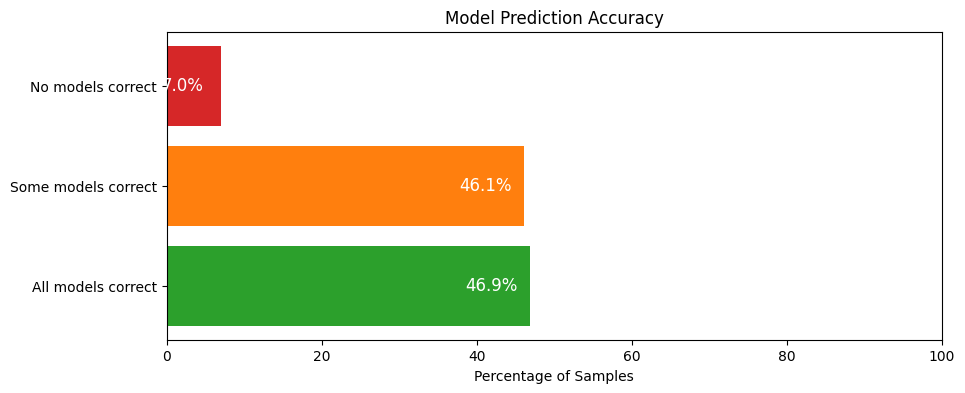

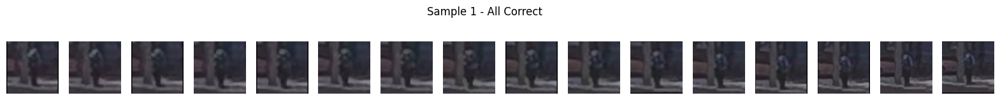

Sample 1:
Speed : tensor([[42.0039],
        [42.0039],
        [42.0039],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [40.0083],
        [42.0039],
        [42.0039]])
  Prediction (Fusion): 0.009116888046264648
  Prediction (C3D): 0.1333482563495636
  Prediction (OneFrame): 0.4195879101753235
  Label (from loader): [0.]
  Label (from array): 0.0


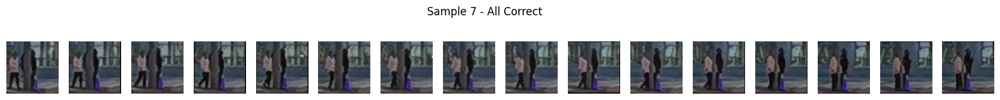

Sample 7:
Speed : tensor([[32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143]])
  Prediction (Fusion): 0.1317737102508545
  Prediction (C3D): 0.206931471824646
  Prediction (OneFrame): 0.04221129044890404
  Label (from loader): [0.]
  Label (from array): 0.0


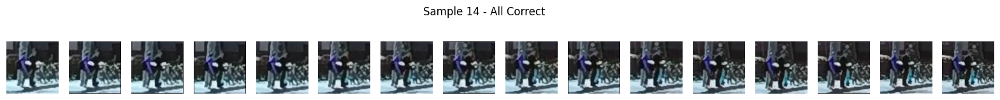

Sample 14:
Speed : tensor([[38.0127],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010]])
  Prediction (Fusion): 0.020906487479805946
  Prediction (C3D): 0.16016526520252228
  Prediction (OneFrame): 0.09719904512166977
  Label (from loader): [0.]
  Label (from array): 0.0


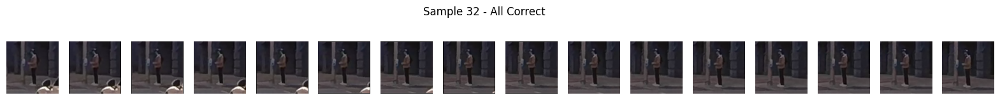

Sample 32:
Speed : tensor([[18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [20.0041],
        [20.0041],
        [20.0041]])
  Prediction (Fusion): 0.031619928777217865
  Prediction (C3D): 0.2794227600097656
  Prediction (OneFrame): 0.15740180015563965
  Label (from loader): [0.]
  Label (from array): 0.0


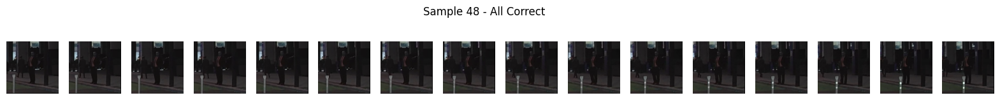

Sample 48:
Speed : tensor([[4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [5.0051],
        [6.0029],
        [6.0029],
        [6.0029],
        [6.0029],
        [6.0029],
        [7.0006],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984]])
  Prediction (Fusion): 0.1611410528421402
  Prediction (C3D): 0.40626001358032227
  Prediction (OneFrame): 0.4942737817764282
  Label (from loader): [0.]
  Label (from array): 0.0


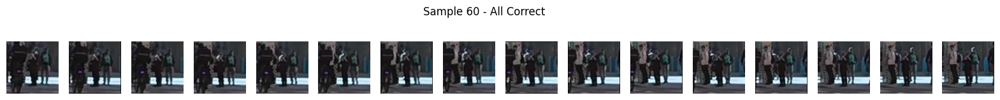

Sample 60:
Speed : tensor([[26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [26.0070],
        [27.0048],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026]])
  Prediction (Fusion): 0.08850410580635071
  Prediction (C3D): 0.33771851658821106
  Prediction (OneFrame): 0.06768453866243362
  Label (from loader): [0.]
  Label (from array): 0.0


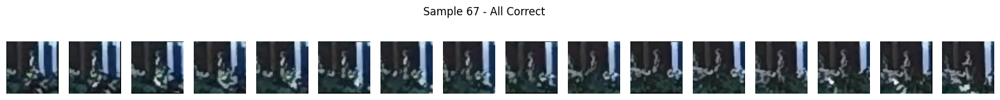

Sample 67:
Speed : tensor([[38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127],
        [38.0127]])
  Prediction (Fusion): 0.01238209381699562
  Prediction (C3D): 0.28810879588127136
  Prediction (OneFrame): 0.4130360782146454
  Label (from loader): [0.]
  Label (from array): 0.0


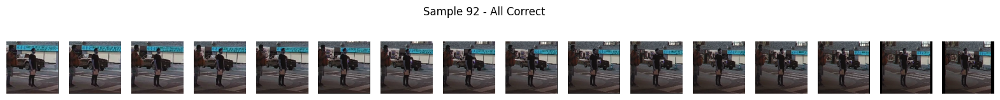

Sample 92:
Speed : tensor([[20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [18.0086],
        [15.9969],
        [15.9969],
        [15.9969],
        [14.9991],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [12.0057],
        [10.0101]])
  Prediction (Fusion): 0.6830854415893555
  Prediction (C3D): 0.6084036231040955
  Prediction (OneFrame): 0.6759283542633057
  Label (from loader): [1.]
  Label (from array): 1.0


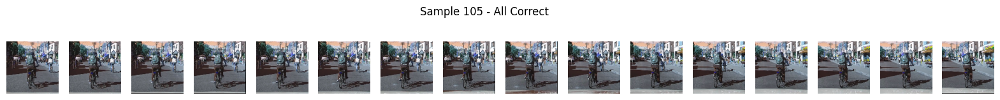

Sample 105:
Speed : tensor([[12.0057],
        [12.0057],
        [12.0057],
        [12.0057],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013]])
  Prediction (Fusion): 0.3213214874267578
  Prediction (C3D): 0.2288622260093689
  Prediction (OneFrame): 0.07153922319412231
  Label (from loader): [0.]
  Label (from array): 0.0


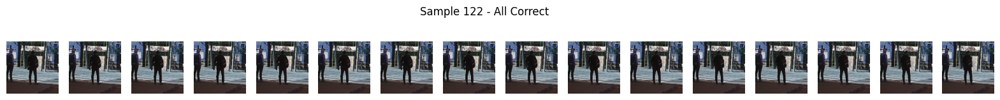

Sample 122:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.6291714310646057
  Prediction (C3D): 0.9924191236495972
  Prediction (OneFrame): 0.9567293524742126
  Label (from loader): [1.]
  Label (from array): 1.0


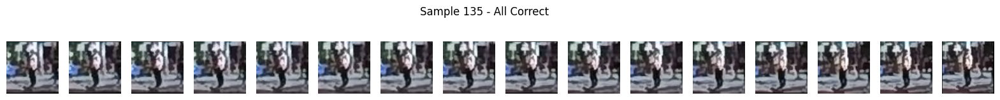

Sample 135:
Speed : tensor([[24.0114],
        [26.0070],
        [26.0070],
        [26.0070],
        [28.0026],
        [28.0026],
        [28.0026],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [32.0099],
        [32.0099],
        [32.0099],
        [32.0099]])
  Prediction (Fusion): 0.08102016896009445
  Prediction (C3D): 0.12039521336555481
  Prediction (OneFrame): 0.02702718786895275
  Label (from loader): [0.]
  Label (from array): 0.0


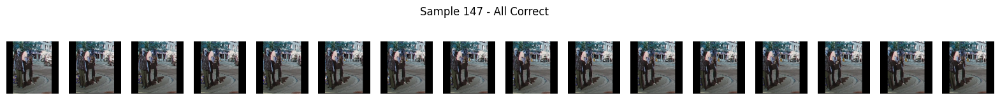

Sample 147:
Speed : tensor([[1.9956],
        [1.9956],
        [1.9956],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]])
  Prediction (Fusion): 0.786163330078125
  Prediction (C3D): 0.5179384350776672
  Prediction (OneFrame): 0.834291398525238
  Label (from loader): [1.]
  Label (from array): 1.0


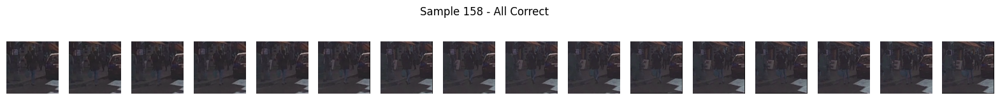

Sample 158:
Speed : tensor([[15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969],
        [15.9969]])
  Prediction (Fusion): 0.20233586430549622
  Prediction (C3D): 0.1977345198392868
  Prediction (OneFrame): 0.24462220072746277
  Label (from loader): [0.]
  Label (from array): 0.0


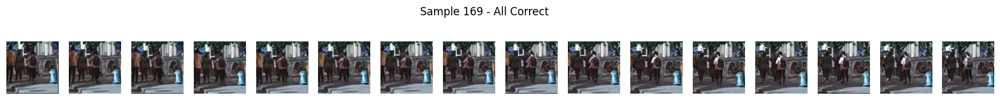

Sample 169:
Speed : tensor([[ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [12.0057],
        [12.0057],
        [12.0057],
        [12.0057],
        [12.0057],
        [12.0057],
        [14.0013]])
  Prediction (Fusion): 0.03340311720967293
  Prediction (C3D): 0.16736043989658356
  Prediction (OneFrame): 0.3964153826236725
  Label (from loader): [0.]
  Label (from array): 0.0


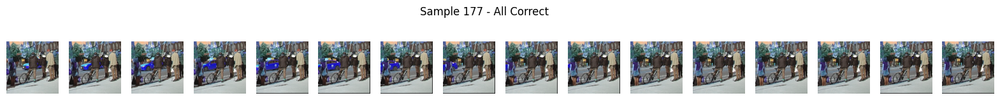

Sample 177:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.7395882606506348
  Prediction (C3D): 0.6685025095939636
  Prediction (OneFrame): 0.9798792600631714
  Label (from loader): [1.]
  Label (from array): 1.0


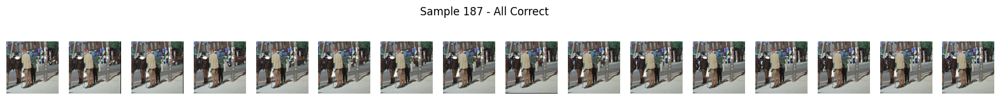

Sample 187:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.7936431169509888
  Prediction (C3D): 0.8414241075515747
  Prediction (OneFrame): 0.9298285245895386
  Label (from loader): [1.]
  Label (from array): 1.0


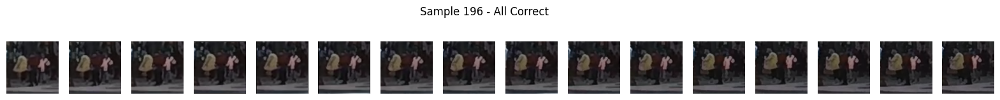

Sample 196:
Speed : tensor([[36.0010],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054],
        [34.0054]])
  Prediction (Fusion): 0.059114616364240646
  Prediction (C3D): 0.11549779027700424
  Prediction (OneFrame): 0.3053663671016693
  Label (from loader): [0.]
  Label (from array): 0.0


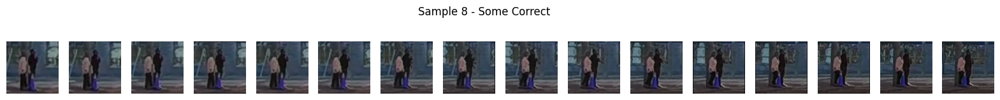

Sample 8:
Speed : tensor([[30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143],
        [30.0143]])
  Prediction (Fusion): 0.12984485924243927
  Prediction (C3D): 0.16513311862945557
  Prediction (OneFrame): 0.5821940302848816
  Label (from loader): [0.]
  Label (from array): 0.0


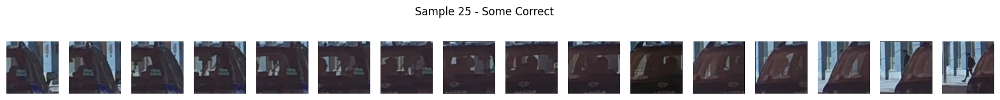

Sample 25:
Speed : tensor([[12.0057],
        [12.0057],
        [12.0057],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013],
        [14.0013]])
  Prediction (Fusion): 0.4215996265411377
  Prediction (C3D): 0.32281073927879333
  Prediction (OneFrame): 0.5691697597503662
  Label (from loader): [0.]
  Label (from array): 0.0


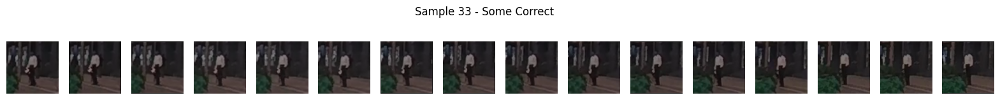

Sample 33:
Speed : tensor([[21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114]])
  Prediction (Fusion): 0.14323213696479797
  Prediction (C3D): 0.2501923441886902
  Prediction (OneFrame): 0.8473265171051025
  Label (from loader): [0.]
  Label (from array): 0.0


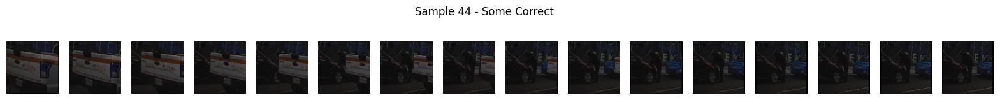

Sample 44:
Speed : tensor([[1.9956],
        [1.9956],
        [1.9956],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]])
  Prediction (Fusion): 0.8243011832237244
  Prediction (C3D): 0.4154752492904663
  Prediction (OneFrame): 0.536048173904419
  Label (from loader): [0.]
  Label (from array): 0.0


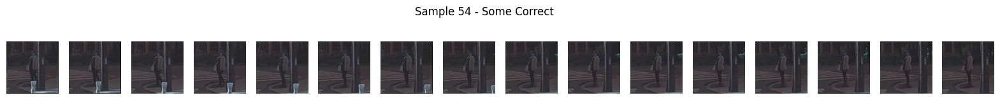

Sample 54:
Speed : tensor([[ 6.0029],
        [ 6.0029],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101]])
  Prediction (Fusion): 0.12502384185791016
  Prediction (C3D): 0.662070095539093
  Prediction (OneFrame): 0.9046744108200073
  Label (from loader): [0.]
  Label (from array): 0.0


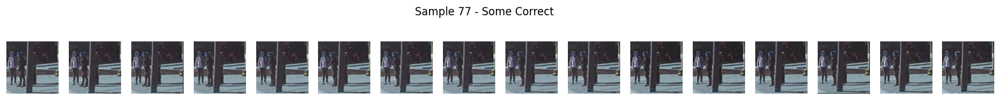

Sample 77:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.6560608148574829
  Prediction (C3D): 0.4571117162704468
  Prediction (OneFrame): 0.4051492214202881
  Label (from loader): [0.]
  Label (from array): 0.0


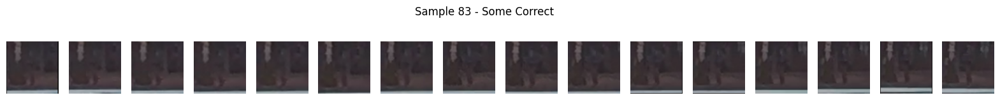

Sample 83:
Speed : tensor([[18.0086],
        [18.0086],
        [19.0064],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997]])
  Prediction (Fusion): 0.03909371793270111
  Prediction (C3D): 0.26599469780921936
  Prediction (OneFrame): 0.6851813793182373
  Label (from loader): [0.]
  Label (from array): 0.0


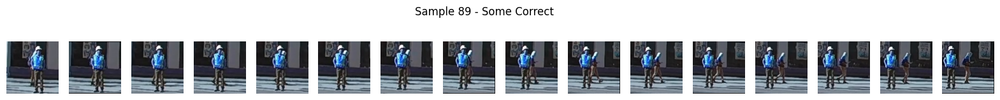

Sample 89:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.5660688281059265
  Prediction (C3D): 0.28897252678871155
  Prediction (OneFrame): 0.8550399541854858
  Label (from loader): [0.]
  Label (from array): 0.0


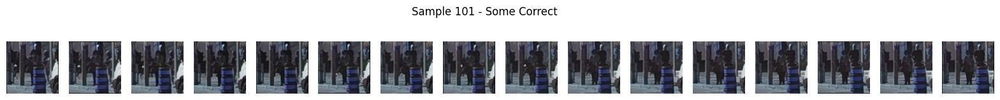

Sample 101:
Speed : tensor([[4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073]])
  Prediction (Fusion): 0.5455092191696167
  Prediction (C3D): 0.28727781772613525
  Prediction (OneFrame): 0.4476765990257263
  Label (from loader): [0.]
  Label (from array): 0.0


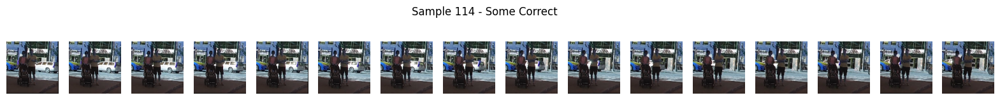

Sample 114:
Speed : tensor([[7.0006],
        [6.0029],
        [6.0029],
        [6.0029],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [1.9956],
        [1.9956],
        [1.9956],
        [1.9956],
        [1.9956],
        [1.9956],
        [0.0000]])
  Prediction (Fusion): 0.5381112694740295
  Prediction (C3D): 0.5587489604949951
  Prediction (OneFrame): 0.354920357465744
  Label (from loader): [1.]
  Label (from array): 1.0


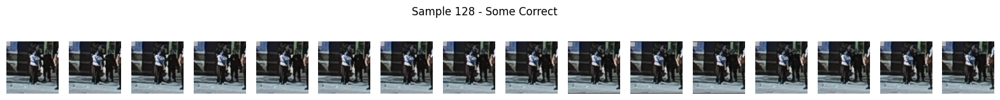

Sample 128:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.6499192714691162
  Prediction (C3D): 0.24562975764274597
  Prediction (OneFrame): 0.1288640797138214
  Label (from loader): [1.]
  Label (from array): 1.0


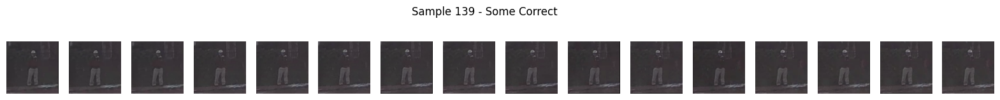

Sample 139:
Speed : tensor([[12.0057],
        [12.0057],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [10.0101],
        [ 9.0043],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [ 7.9984],
        [ 6.0029],
        [ 6.0029],
        [ 6.0029],
        [ 6.0029]])
  Prediction (Fusion): 0.6443440914154053
  Prediction (C3D): 0.3370216488838196
  Prediction (OneFrame): 0.7218631505966187
  Label (from loader): [0.]
  Label (from array): 0.0


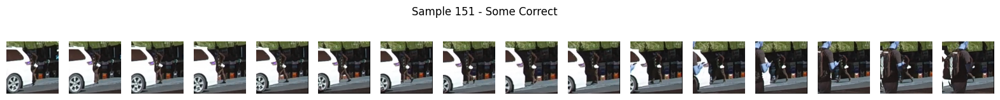

Sample 151:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.8335927724838257
  Prediction (C3D): 0.31416061520576477
  Prediction (OneFrame): 0.8777390122413635
  Label (from loader): [1.]
  Label (from array): 1.0


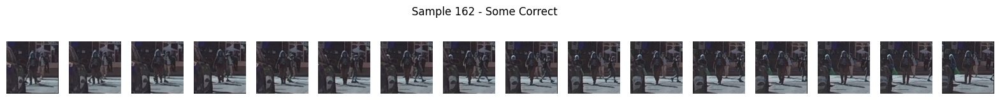

Sample 162:
Speed : tensor([[18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086],
        [18.0086]])
  Prediction (Fusion): 0.08520463109016418
  Prediction (C3D): 0.4697135090827942
  Prediction (OneFrame): 0.5781914591789246
  Label (from loader): [0.]
  Label (from array): 0.0


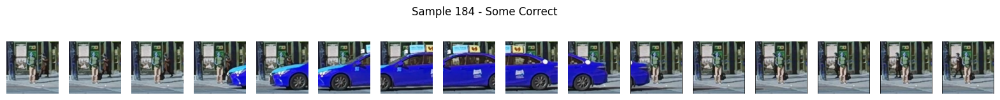

Sample 184:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.6532596945762634
  Prediction (C3D): 0.4098622500896454
  Prediction (OneFrame): 0.5607134103775024
  Label (from loader): [1.]
  Label (from array): 1.0


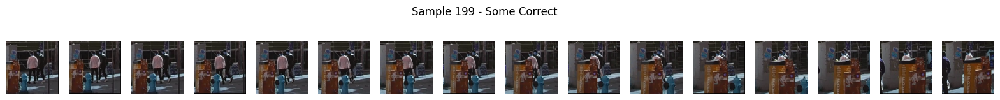

Sample 199:
Speed : tensor([[24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [24.0114],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [21.9997],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041],
        [20.0041]])
  Prediction (Fusion): 0.6384921073913574
  Prediction (C3D): 0.5907742977142334
  Prediction (OneFrame): 0.3319071829319
  Label (from loader): [1.]
  Label (from array): 1.0


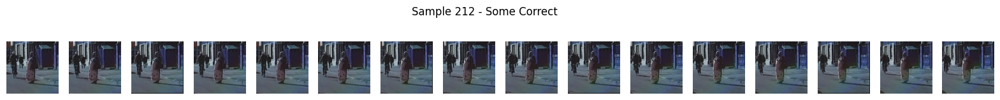

Sample 212:
Speed : tensor([[7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984],
        [7.9984]])
  Prediction (Fusion): 0.4226604104042053
  Prediction (C3D): 0.2310192883014679
  Prediction (OneFrame): 0.6128963232040405
  Label (from loader): [0.]
  Label (from array): 0.0


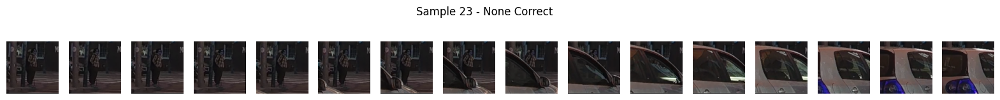

Sample 23:
Speed : tensor([[4.0073],
        [4.0073],
        [4.0073],
        [3.0014],
        [1.9956],
        [1.9956],
        [1.9956],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]])
  Prediction (Fusion): 0.5576202273368835
  Prediction (C3D): 0.7178962230682373
  Prediction (OneFrame): 0.8224843144416809
  Label (from loader): [0.]
  Label (from array): 0.0


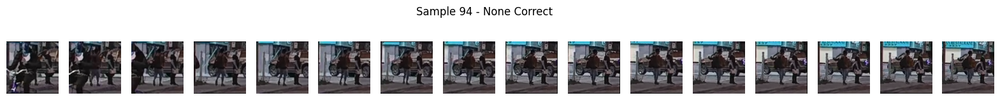

Sample 94:
Speed : tensor([[26.0070],
        [26.0070],
        [27.0048],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026],
        [28.0026]])
  Prediction (Fusion): 0.15515078604221344
  Prediction (C3D): 0.29037100076675415
  Prediction (OneFrame): 0.047859955579042435
  Label (from loader): [1.]
  Label (from array): 1.0


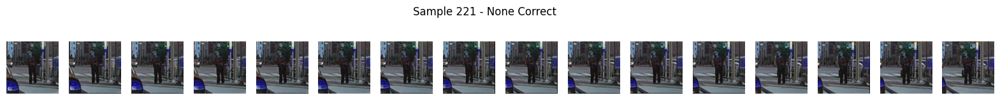

Sample 221:
Speed : tensor([[4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073]])
  Prediction (Fusion): 0.5450780391693115
  Prediction (C3D): 0.5193058848381042
  Prediction (OneFrame): 0.804826021194458
  Label (from loader): [0.]
  Label (from array): 0.0


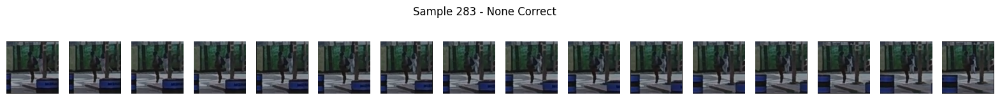

Sample 283:
Speed : tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.9978],
        [1.9956],
        [1.9956],
        [1.9956],
        [1.9956]])
  Prediction (Fusion): 0.5781561732292175
  Prediction (C3D): 0.5214472413063049
  Prediction (OneFrame): 0.8352898359298706
  Label (from loader): [0.]
  Label (from array): 0.0


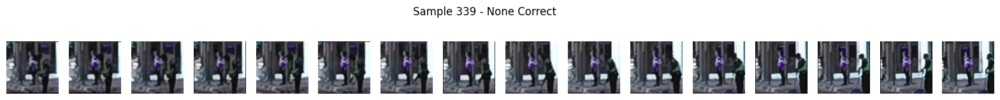

Sample 339:
Speed : tensor([[36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010],
        [36.0010]])
  Prediction (Fusion): 0.021266143769025803
  Prediction (C3D): 0.2770829200744629
  Prediction (OneFrame): 0.1180417537689209
  Label (from loader): [1.]
  Label (from array): 1.0


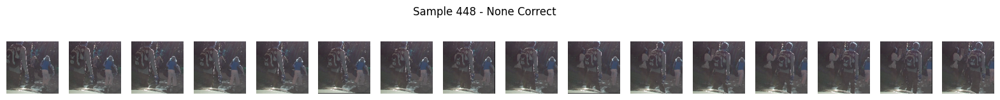

Sample 448:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.5378766655921936
  Prediction (C3D): 0.5033137202262878
  Prediction (OneFrame): 0.8035927414894104
  Label (from loader): [0.]
  Label (from array): 0.0


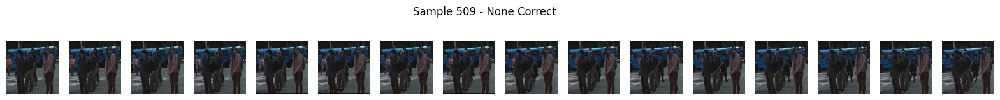

Sample 509:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.791329562664032
  Prediction (C3D): 0.5515552163124084
  Prediction (OneFrame): 0.9349691867828369
  Label (from loader): [0.]
  Label (from array): 0.0


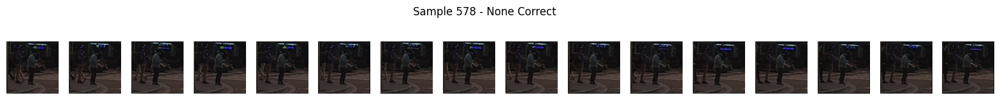

Sample 578:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.5551374554634094
  Prediction (C3D): 0.7007003426551819
  Prediction (OneFrame): 0.9062362909317017
  Label (from loader): [0.]
  Label (from array): 0.0


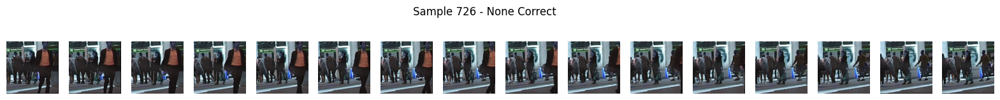

Sample 726:
Speed : tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.]])
  Prediction (Fusion): 0.6501383781433105
  Prediction (C3D): 0.5776727795600891
  Prediction (OneFrame): 0.8833934664726257
  Label (from loader): [0.]
  Label (from array): 0.0


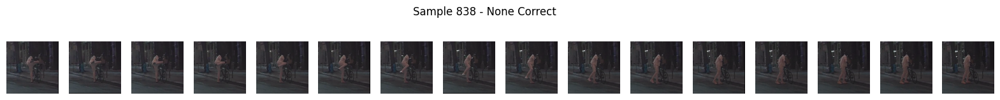

Sample 838:
Speed : tensor([[4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073],
        [4.0073]])
  Prediction (Fusion): 0.5302600264549255
  Prediction (C3D): 0.5384557247161865
  Prediction (OneFrame): 0.9127037525177002
  Label (from loader): [0.]
  Label (from array): 0.0


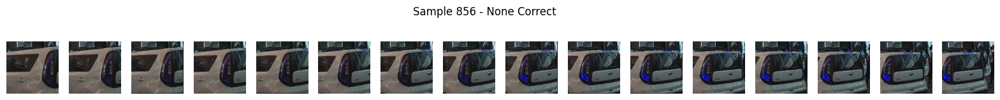

Sample 856:
Speed : tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [1.9956]])
  Prediction (Fusion): 0.753510057926178
  Prediction (C3D): 0.5407159924507141
  Prediction (OneFrame): 0.959704577922821
  Label (from loader): [0.]
  Label (from array): 0.0


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

configs = {
    "model_opts": {
        "input_type": ["local_context","speed"],  # which type of input to use (local_context or speed)
        "enlarge_ratio": 1.5 , #how much to enlarge cropped image around bounding box
        "obs_length": 16, #num frames of sequence
        "time_to_event": [30, 60],  # 30, 60
        "overlap": 0.6, #how much overlap of sequences created from the same event (to increase available samples)
        "normalize_boxes": False,
        "target_dim":(112,112)
    },
    "train_opts": {
        "batch_size": 32,
        "epochs": 2,
        "lr": 5.0e-05,
    },
}
method_class = Fusion()
test_data = method_class.get_data('test', pie_seq_test, {**configs["model_opts"], 'batch_size': 1})
test_loader = DataLoader(test_data['data'], batch_size=1, shuffle=False,num_workers=2)
# Assuming method_class and test_loader are already defined as in the provided code
preds_fus = np.load('/content/drive/MyDrive/Computer Vision/Fusion/predictions.npy')
preds_c3d = np.load('/content/drive/MyDrive/Computer Vision/C3D/predictions.npy')
preds_one = np.load('/content/drive/MyDrive/Computer Vision/OneFrame/predictions.npy')
labels = np.load('/content/drive/MyDrive/Computer Vision/C3D/targets.npy')
# Convert predictions to binary format (assuming binary classification with threshold 0.5)
preds_fus_binary = preds_fus > 0.5
preds_c3d_binary = preds_c3d > 0.5
preds_one_binary = preds_one > 0.5

# Compare predictions with ground truth labels
correct_fus = preds_fus_binary == labels
correct_c3d = preds_c3d_binary == labels
correct_one = preds_one_binary == labels

# Calculate the combined correctness
all_correct = correct_fus & correct_c3d & correct_one
some_correct = (correct_fus | correct_c3d | correct_one) & ~all_correct
none_correct = ~correct_fus & ~correct_c3d & ~correct_one

# Calculate percentages
total_samples = labels.shape[0]
percent_all_correct = np.mean(all_correct) * 100
percent_some_correct = np.mean(some_correct) * 100
percent_none_correct = np.mean(none_correct) * 100
# Visualize the results using a bar plot
percentages = [percent_all_correct, percent_some_correct, percent_none_correct]
labels_name = ['All models correct', 'Some models correct', 'No models correct']
colors = ['#2ca02c', '#ff7f0e', '#d62728']  #

fig, ax = plt.subplots(figsize=(10, 4))

bars = ax.barh(labels_name, percentages, color=colors)

# Add percentage labels to the bars
for bar in bars:
    width = bar.get_width()
    ax.text(width - 5, bar.get_y() + bar.get_height() / 2, f'{width:.1f}%',
            ha='center', va='center', color='white', fontsize=12)

ax.set_xlim(0, 100)
ax.set_xlabel('Percentage of Samples')
ax.set_title('Model Prediction Accuracy')

plt.show()
example_indices = {
    'all_correct': np.where(all_correct)[0][:100],
    'some_correct': np.where(some_correct)[0][:100],
    'none_correct': np.where(none_correct)[0][:100],
}

for category, indices in example_indices.items():
    for i, idx in enumerate(indices):
        if(i%6!=0):
          continue

        input, label = test_loader.dataset[idx]
        frames = input[0].numpy() / 255.0

        fig, axes = plt.subplots(1, 16, figsize=(20, 2))
        for j in range(16):
            axes[j].imshow(frames[j])
            axes[j].axis('off')

        plt.suptitle(f"Sample {idx + 1} - {category.replace('_', ' ').title()}")
        plt.show()

        pred_fus = preds_fus[idx]
        pred_c3d = preds_c3d[idx]
        pred_one = preds_one[idx]
        label_from_loader = label.numpy()

        print(f"Sample {idx + 1}:")
        print(f"Speed : {input[1]}")
        print(f"  Prediction (Fusion): {pred_fus}")
        print(f"  Prediction (C3D): {pred_c3d}")
        print(f"  Prediction (OneFrame): {pred_one}")
        print(f"  Label (from loader): {label_from_loader}")
        print(f"  Label (from array): {labels[idx]}")


In [ ]:
from collections import Counter
configs = {
      "model_opts": {
          "input_type": ["local_context","speed"],  # which type of input to use (local_context or speed)
          "enlarge_ratio": 1.5 , #how much to enlarge cropped image around bounding box
          "obs_length": 16, #num frames of sequence
          "time_to_event": [30, 60],  # 30, 60
          "overlap": 0.6, #how much overlap of sequences created from the same event (to increase available samples)
          "normalize_boxes": False,
          "target_dim":(112,112)
      },
      "train_opts": {
          "batch_size": 32,
          "epochs": 2,
          "lr": 5.0e-05,
      },
  }
method_class = Fusion()
dict_train = method_class.get_data('train', pie_seq_train,{**configs["model_opts"], 'batch_size': 1})
dict_val = method_class.get_data('val', pie_seq_val,{**configs["model_opts"], 'batch_size': 1})
dict_test = method_class.get_data('test', pie_seq_test, {**configs["model_opts"], 'batch_size': 1})
def count_labels(labels):
    label_counts = Counter()
    for label in labels:
        label_counts.update(label[0])
    return label_counts

# Count labels in each loader
train_label_counts = count_labels(dict_train['labels'])
val_label_counts = count_labels(dict_val['labels'])
test_label_counts = count_labels(dict_test['labels'])

print(f"Train labels count: {train_label_counts}")
print(f"Validation labels count: {val_label_counts}")
print(f"Test labels count: {test_label_counts}")


#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
#####################################

#####################################
Generating local_context train
#####################################

#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
#####################################

#####################################
Generating local_context val
#####################################

#####################################
Generating raw data dict_keys(['image', 'pid', 'bbox', 'center', 'occlusion', 'obd_speed', 'gps_speed', 'heading_angle', 'gps_coord', 'yrp', 'intention_prob', 'activities', 'image_dimension'])
##############